# DeepFake Introductory EDA

## Introduction
Today's technology allows us to do the incredible things such as creation of fake videos or images of real people, [deepfakes](https://en.wikipedia.org/wiki/Deepfake). Deepfakes [are going viral](https://www.creativebloq.com/features/deepfake-examples) and creating a lot of credibility and security concerns. That is why deepfake detection is a fast growing area of research (I put some of the papers related to deepfakes in the end of the notebook).

In this analysis I will try to look close at the videos from the sample dataset on Kaggle and find traits which can help us distinguish the fakes from the real videos.

In [6]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import file utilities
import os
import glob

# import charting
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, ArtistAnimation 
%matplotlib inline

from IPython.display import HTML

# import computer vision
import cv2
from skimage.measure import compare_ssim

In [7]:
import numpy as np
import pandas as pd
import os
import glob
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
import torch
from tqdm.notebook import tqdm
import os, sys, time

import torch
import torch.nn as nn
import torch.nn.functional as F

%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

import warnings
warnings.filterwarnings("ignore")
import cv2
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
import torch
from tqdm.notebook import tqdm
import time

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

In [8]:
!pip install facenet-pytorch

     |████████████████████████████████| 1.9MB 6.5MB/s eta 0:00:01


In [6]:
from IPython.display import HTML
from base64 import b64encode
vid1 = open('/kaggle/input/deepfake-detection-challenge/test_videos/ytddugrwph.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(vid1).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## Load Data

First of all, we need to declare the paths to train and test samples and metadata file:

In [9]:
TEST_PATH = '../input/deepfake-detection-challenge/test_videos/'
train_dir = '../input/deepfake-detection-challenge/train_sample_videos/'

metadataa = '../input/deepfake-detection-challenge/train_sample_videos/metadata.json'

In [10]:
metadata = pd.read_json('/kaggle/input/deepfake-detection-challenge/train_sample_videos/metadata.json').T
list_fake_videos = list(metadata.loc[metadata['label']=='FAKE',:].index.values)
print(len(list_fake_videos))

323


Look at the number of samples in test and train sets:

In [12]:
# load the filenames for train videos
train_fns = sorted(glob.glob(train_dir + '*.mp4'))

# load the filenames for test videos
test_fns = sorted(glob.glob(TEST_PATH + '*.mp4'))

print('There are {} samples in the train set.'.format(len(train_fns)))
print('There are {} samples in the test set.'.format(len(test_fns)))

There are 400 samples in the train set.
There are 400 samples in the test set.


And load the metadata:

In [13]:
meta = pd.read_json(metadataa).transpose()
meta.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


In the metadata we have a reference to the original video, but those videos can't be found among the samples on Kaggle.

You can find the original videos if you download the whole dataset.

Analyze the number or fake and real samples:

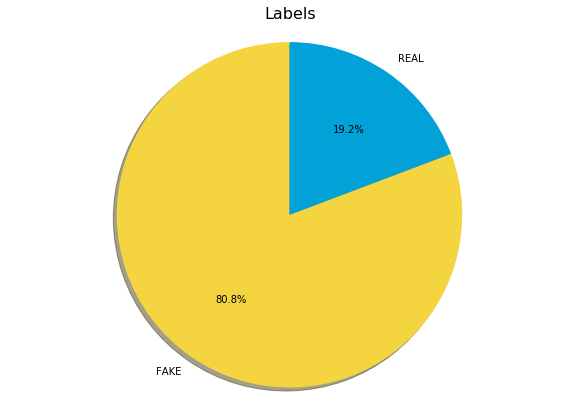

In [14]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'FAKE', 'REAL'
sizes = [meta[meta.label == 'FAKE'].label.count(), meta[meta.label == 'REAL'].label.count()]

fig1, ax1 = plt.subplots(figsize=(10,7))
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90, colors=['#f4d53f', '#02a1d8'])
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Labels', fontsize=16)

plt.show()

__Only 19% of samples are real videos.__ I don't know if this is the same for the whole dataset.

## Preview Videos and Zoom into Faces

In [16]:
def get_frame(filename):
    '''
    Helper function to return the 1st frame of the video by filename
    INPUT: 
        filename - the filename of the video
    OUTPUT:
        image - 1st frame of the video (RGB)
    '''
    # Playing video from file
    cap = cv2.VideoCapture(filename)
    ret, frame = cap.read()

    # Our operations on the frame come here
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # When everything done, release the capture
    cap.release()
    cv2.destroyAllWindows()
    
    return image
def get_label(filename, meta):
    '''
    Helper function to get a label from the filepath.
    INPUT:
        filename - filename of the video
        meta - dataframe containing metadata.json
    OUTPUT:
        label - label of the video 'FAKE' or 'REAL'
    '''
    video_id = filename.split('/')[-1]
    return meta.loc[video_id].label
def get_original_filename(filename, meta):
    '''
    Helper function to get the filename of the original image
    INPUT:
        filename - filename of the video
        meta - dataframe containing metadata.json
    OUTPUT:
        original_filename - name of the original video
    '''
    video_id = filename.split('/')[-1]
    original_id = meta.loc[video_id].original
    
    return original_id
def visualize_frame(filename, meta, train = True):
    '''
    Helper function to visualize the 1st frame of the video by filename and metadata
    INPUT:
        filename - video filename
        meta - dataframe containing metadata.json
        train - indicates that the video is among train samples and the label can be retrived from metadata
    '''
    # get the 1st frame of the video
    image = get_frame(filename)

    # Display the 1st frame of the video
    fig, axs = plt.subplots(1,3, figsize=(20,7))
    axs[0].imshow(image) 
    axs[0].axis('off')
    axs[0].set_title('Original frame')
    
    # Extract the face with haar cascades
    face_cascade = cv2.CascadeClassifier('../input/haarcascades/haarcascade_frontalface_default.xml')

    # run the detector
    # the output here is an array of detections; the corners of each detection box
    # if necessary, modify these parameters until you successfully identify every face in a given image
    faces = face_cascade.detectMultiScale(image, 1.2, 3)

    # make a copy of the original image to plot detections on
    image_with_detections = image.copy()

    # loop over the detected faces, mark the image where each face is found
    for (x,y,w,h) in faces:
        # draw a rectangle around each detected face
        # you may also need to change the width of the rectangle drawn depending on image resolution
        cv2.rectangle(image_with_detections,(x,y),(x+w,y+h),(255,0,0),3)

    axs[1].imshow(image_with_detections)
    axs[1].axis('off')
    axs[1].set_title('Highlight faces')
    
    # crop out the 1st face
    crop_img = image.copy()
    for (x,y,w,h) in faces:
        crop_img = image[y:y+h, x:x+w]
        break;
        
    # plot the 1st face
    axs[2].imshow(crop_img)
    axs[2].axis('off')
    axs[2].set_title('Zoom-in face')
    
    if train:
        plt.suptitle('Image {image} label: {label}'.format(image = filename.split('/')[-1], label=get_label(filename, meta)))
    else:
        plt.suptitle('Image {image}'.format(image = filename.split('/')[-1]))
    plt.show()

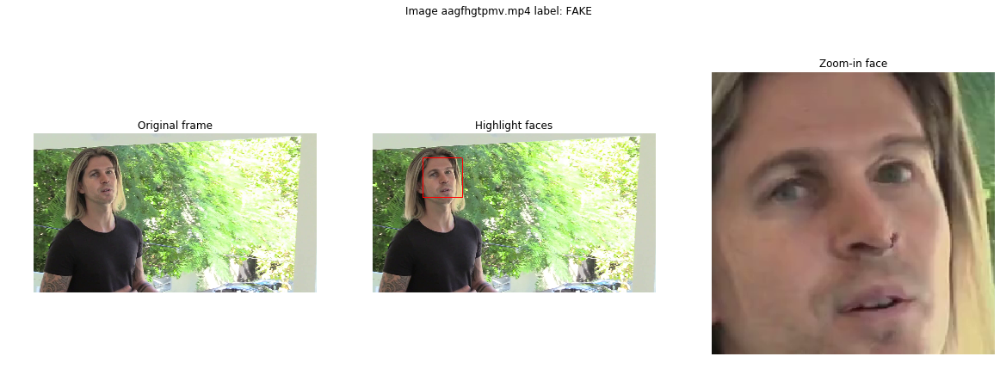

In [17]:
visualize_frame(train_fns[0], meta)

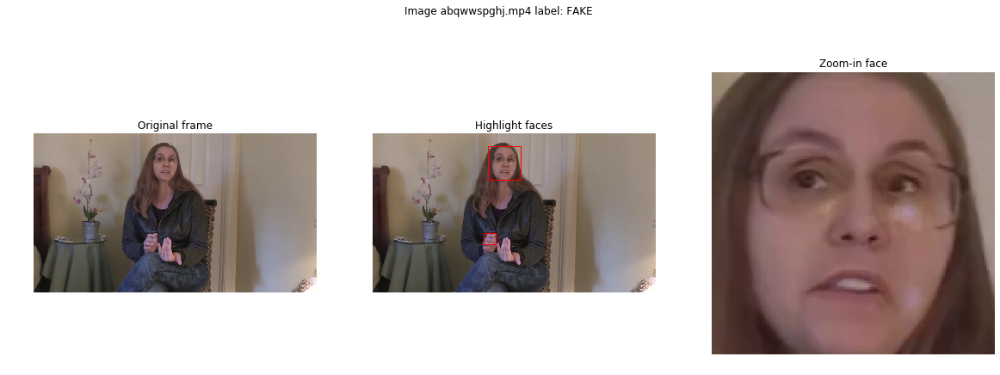

In [12]:
visualize_frame(train_fns[4], meta)

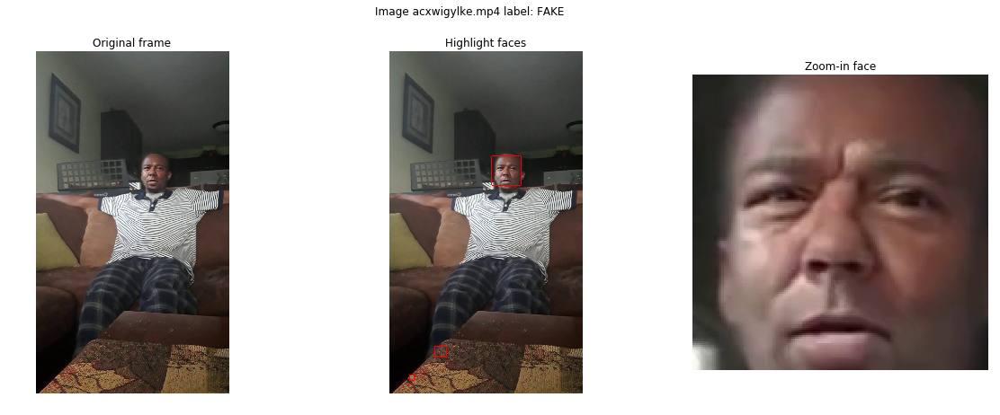

In [13]:
visualize_frame(train_fns[8], meta)

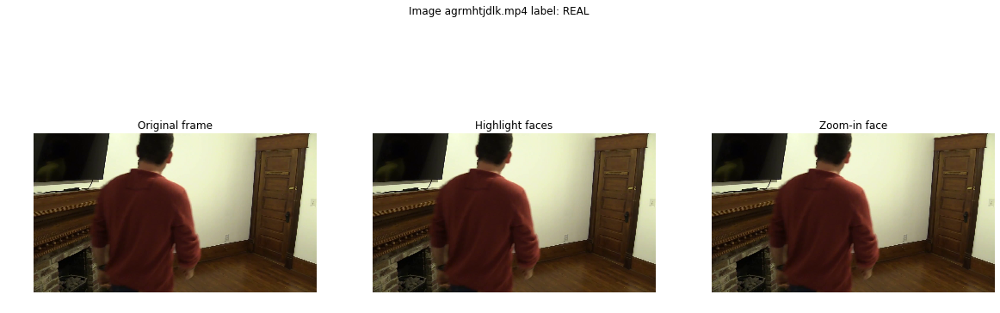

In [14]:
visualize_frame('../input/deepfake-detection-challenge/train_sample_videos/agrmhtjdlk.mp4', meta)

               label  split        original
aqpnvjhuzw.mp4  FAKE  train  xngpzquyhs.mp4
cdbsbdymzd.mp4  FAKE  train  xngpzquyhs.mp4
ecuvtoltue.mp4  FAKE  train  xngpzquyhs.mp4
efdyrflcpg.mp4  FAKE  train  xngpzquyhs.mp4
aqpnvjhuzw.mp4
cdbsbdymzd.mp4


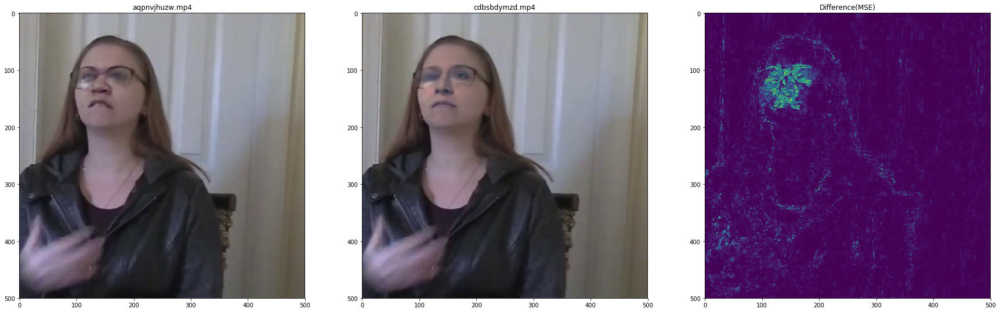

               label  split        original
bdbhekrrwo.mp4  FAKE  train  qtnjyomzwo.mp4
cxfujlvsuw.mp4  FAKE  train  qtnjyomzwo.mp4
dbhoxkblzx.mp4  FAKE  train  qtnjyomzwo.mp4
ddjggcasdw.mp4  FAKE  train  qtnjyomzwo.mp4
bdbhekrrwo.mp4
cxfujlvsuw.mp4


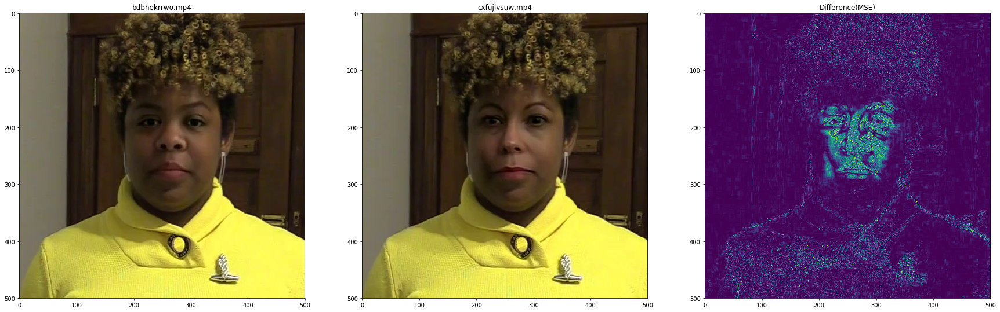

               label  split        original
asmpfjfzif.mp4  FAKE  train  dzyuwjkjui.mp4
drtbksnpol.mp4  FAKE  train  dzyuwjkjui.mp4
dsdoseflas.mp4  FAKE  train  dzyuwjkjui.mp4
emaalmsonj.mp4  FAKE  train  dzyuwjkjui.mp4
asmpfjfzif.mp4
drtbksnpol.mp4


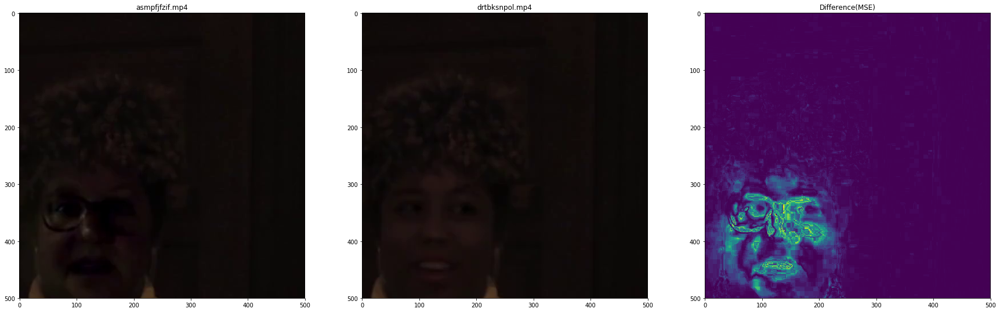

In [11]:
L=["xngpzquyhs.mp4","qtnjyomzwo.mp4","dzyuwjkjui.mp4"]
for i in range(len(L)):
    train_frequent=meta[meta["original"]==L[i]]
    print(train_frequent)
    frame_num=0
    video_1=list(train_frequent.index)[0]
    video_2=list(train_frequent.index)[1]
    print(video_1)
    print(video_2)

    fig, axes = plt.subplots(1,3, figsize=(30,10))

    cap = cv2.VideoCapture(train_dir+video_1)
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
    _, image = cap.read()
    image_1 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    cap.release()
    axes[0].imshow(image_1[0:500,850:1350,:])
    axes[0].title.set_text(f"{video_1}")
    cap = cv2.VideoCapture(train_dir+video_2)
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
    _, image = cap.read()
    image_2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    cap.release()
    axes[1].imshow(image_2[0:500,850:1350,:])
    axes[1].title.set_text(f"{video_2}")
    image_3=np.sum((image_1-image_2)**2,axis=2)
    axes[2].imshow(image_3[0:500,850:1350])
    axes[2].title.set_text("Difference(MSE)")
    plt.show()

In [12]:
def get_frames_zoomed(filename):
    '''
    Get all frames from the video zoomed into the face
    INPUT:
        filename - video filename
    OUTPUT:
        frames - the array of video frames
    '''
    frames = []
    cap = cv2.VideoCapture(filename)
    
    face_cascade = cv2.CascadeClassifier('../input/haarcascades/haarcascade_frontalface_default.xml')

    while(cap.isOpened()):
        ret, frame = cap.read()
                
        if not ret:
            break;
            
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        faces = face_cascade.detectMultiScale(image, 1.2, 3)
        image_with_detections = image.copy()

        crop_img = image.copy()
        for (x,y,w,h) in faces:
            crop_img = image[y:y+h, x:x+w]
            break;
        
        frames.append(crop_img)
    cap.release()
    cv2.destroyAllWindows()
    return frames

def create_animation_zoomed(filename):
    '''
    Function to create the animated cropped faces out of the video
    INPUT:
        filename - filename of the video
    '''
    fig, ax = plt.subplots(1,1, figsize=(10,7))
    frames = get_frames_zoomed(filename)

    def update(frame_number):
        plt.axis('off')
        plt.imshow(frames[frame_number])

    animation = FuncAnimation(fig, update, interval=30, repeat=True)
    return animation

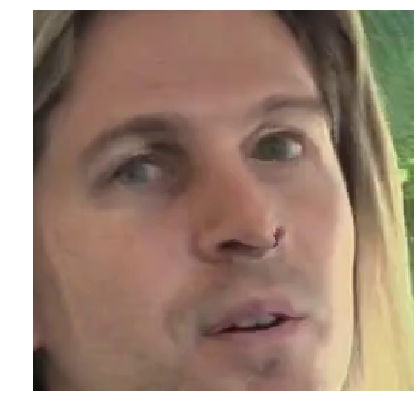

In [20]:
animation = create_animation_zoomed(train_fns[0])
HTML(animation.to_jshtml())

In [13]:
sample = '/kaggle/input/deepfake-detection-challenge/train_sample_videos/aagfhgtpmv.mp4'

reader = cv2.VideoCapture(sample)
images_1080_1920 = []
images_720_1280 = []
images_540_960 = []
for i in tqdm(range(int(reader.get(cv2.CAP_PROP_FRAME_COUNT)))):
    _, image = reader.read()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    images_1080_1920.append(image)
    images_720_1280.append(cv2.resize(image, (1280, 720)))
    images_540_960.append(cv2.resize(image, (960, 540)))
reader.release()

images_1080_1920 = np.stack(images_1080_1920)
images_720_1280 = np.stack(images_720_1280)
images_540_960 = np.stack(images_540_960)

print('Shapes:')
print(images_1080_1920.shape)
print(images_720_1280.shape)
print(images_540_960.shape)


Shapes:
(300, 1080, 1920, 3)
(300, 720, 1280, 3)
(300, 540, 960, 3)


In [15]:
def plot_faces(images, figsize=(10.8/2, 19.2/2)):
    shape = images[0].shape
    images = images[np.linspace(0, len(images)-1, 16).astype(int)]
    im_plot = []
    for i in range(0, 16, 4):
        im_plot.append(np.concatenate(images[i:i+4], axis=0))
    im_plot = np.concatenate(im_plot, axis=1)
    
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    ax.imshow(im_plot)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

    ax.grid(False)
    fig.tight_layout()

def timer(detector, detect_fn, images, *args):
    start = time.time()
    faces = detect_fn(detector, images, *args)
    elapsed = time.time() - start
    print(f', {elapsed:.3f} seconds')
    return faces, elapsed

In [16]:
from facenet_pytorch import MTCNN
detector = MTCNN(device=device, post_process=False)

def detect_facenet_pytorch(detector, images, batch_size):
    faces = []
    for lb in np.arange(0, len(images), batch_size):
        imgs = [img for img in images[lb:lb+batch_size]]
        faces.extend(detector(imgs))
    return faces

times_facenet_pytorch = []    # batched
times_facenet_pytorch_nb = [] # non-batched

Detecting faces in 540x960 frames, 9.935 seconds
Detecting faces in 720x1280 frames, 12.217 seconds
Detecting faces in 1080x1920 frames, 17.568 seconds


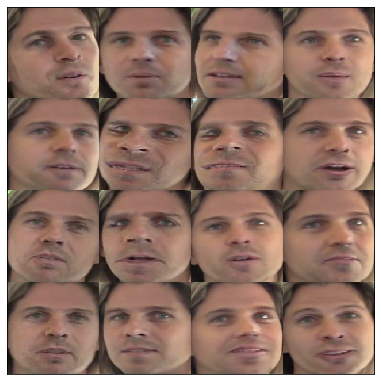

In [17]:
print('Detecting faces in 540x960 frames', end='')
_, elapsed = timer(detector, detect_facenet_pytorch, images_540_960, 60)
times_facenet_pytorch.append(elapsed)

print('Detecting faces in 720x1280 frames', end='')
_, elapsed = timer(detector, detect_facenet_pytorch, images_720_1280, 40)
times_facenet_pytorch.append(elapsed)

print('Detecting faces in 1080x1920 frames', end='')
faces, elapsed = timer(detector, detect_facenet_pytorch, images_1080_1920, 20)
times_facenet_pytorch.append(elapsed)

plot_faces(torch.stack(faces).permute(0, 2, 3, 1).int().numpy())

Let's start with looking at some frames of the videos and trying to look closer at the faces.
I used [HAAR cascades](https://docs.opencv.org/trunk/db/d28/tutorial_cascade_classifier.html) to detect the areas containing the faces on the image.

In [18]:
import os, sys, time
import cv2
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F

%matplotlib inline
import matplotlib.pyplot as plt

In [19]:
test_dir = "/kaggle/input/deepfake-detection-challenge/test_videos/"

test_videos = sorted([x for x in os.listdir(test_dir) if x[-4:] == ".mp4"])
len(test_videos)


400

In [20]:
print("PyTorch version:", torch.__version__)
print("CUDA version:", torch.version.cuda)
print("cuDNN version:", torch.backends.cudnn.version())

PyTorch version: 1.3.0
CUDA version: 10.0.130
cuDNN version: 7603


In [21]:
gpu = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
gpu

device(type='cuda', index=0)

In [27]:
import sys
sys.path.insert(0, "/kaggle/input/blazeface-pytorch")
sys.path.insert(0, "/kaggle/input/deepfakes-inference-demo")

In [28]:
from blazeface import BlazeFace
facedet = BlazeFace().to(gpu)
facedet.load_weights("/kaggle/input/blazeface-pytorch/blazeface.pth")
facedet.load_anchors("/kaggle/input/blazeface-pytorch/anchors.npy")
_ = facedet.train(False)

utilise le module blazeface pour détecter les visages dans les images

In [29]:
from helpers.read_video_1 import VideoReader
from helpers.face_extract_1 import FaceExtractor

frames_per_video = 64 #frame_h * frame_l
video_reader = VideoReader()
video_read_fn = lambda x: video_reader.read_frames(x, num_frames=frames_per_video)
face_extractor = FaceExtractor(video_read_fn, facedet)

In [30]:
from torchvision.transforms import Normalize

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
normalize_transform = Normalize(mean, std)

La fonction isotropically_resize_image est utilisée pour redimensionner une image de manière isotrope, c'est-à-dire en conservant les proportions d'origine.La fonction make_square_image est utilisée pour créer une image carrée à partir d'une image donnée.

In [31]:
def isotropically_resize_image(img, size, resample=cv2.INTER_AREA):
    h, w = img.shape[:2]
    if w > h:
        h = h * size // w
        w = size
    else:
        w = w * size // h
        h = size

    resized = cv2.resize(img, (w, h), interpolation=resample)
    return resized


def make_square_image(img):
    h, w = img.shape[:2]
    size = max(h, w)
    t = 0
    b = size - h
    l = 0
    r = size - w
    return cv2.copyMakeBorder(img, t, b, l, r, cv2.BORDER_CONSTANT, value=0)

In [32]:
!pip install ../input/deepfake-xception-trained-model/pytorchcv-0.0.55-py2.py3-none-any.whl --quiet

In [34]:
input_size = 150

In [37]:
!pip install pytorchcv

In [38]:
from pytorchcv.model_provider import get_model
model = get_model("xception", pretrained=False)
model = nn.Sequential(*list(model.children())[:-1]) # Remove original output layer

class Pooling(nn.Module):
    def __init__(self):
        super(Pooling, self).__init__()
        self.p1 = nn.AdaptiveAvgPool2d((1,1))
        self.p2 = nn.AdaptiveMaxPool2d((1,1))

    def forward(self, x):
        x1 = self.p1(x)
        x2 = self.p2(x)
        return (x1+x2) * 0.5

model[0].final_block.pool = nn.Sequential(nn.AdaptiveAvgPool2d((1,1)))

class Head(torch.nn.Module):
    def __init__(self, in_f, out_f):
        super(Head, self).__init__()
        self.f = nn.Flatten()
        self.l = nn.Linear(in_f, 512)
        self.d = nn.Dropout(0.5)
        self.o = nn.Linear(512, out_f)
        self.b1 = nn.BatchNorm1d(in_f)
        self.b2 = nn.BatchNorm1d(512)
        self.r = nn.ReLU()

    def forward(self, x):
        x = self.f(x)
        x = self.b1(x)
        x = self.d(x)

        x = self.l(x)
        x = self.r(x)
        x = self.b2(x)
        x = self.d(x)

        out = self.o(x)
        return out

class FCN(torch.nn.Module):
    def __init__(self, base, in_f):
        super(FCN, self).__init__()
        self.base = base
        self.h1 = Head(in_f, 1)
    def forward(self, x):
        x = self.base(x)
        return self.h1(x)

In [39]:
def predict_on_video(video_path, batch_size):
    try:
        # Find the faces for N frames in the video.
        faces = face_extractor.process_video(video_path)
        # Only look at one face per frame.
        face_extractor.keep_only_best_face(faces)
        if len(faces) > 0:
            # NOTE: When running on the CPU, the batch size must be fixed
            # or else memory usage will blow up. (Bug in PyTorch?)
            x = np.zeros((batch_size, input_size, input_size, 3), dtype=np.uint8)
            # If we found any faces, prepare them for the model.
            n = 0
            for frame_data in faces:
                for face in frame_data["faces"]:
                    # Resize to the model's required input size.
                    # We keep the aspect ratio intact and add zero
                    # padding if necessary.                    
                    resized_face = isotropically_resize_image(face, input_size)
                    resized_face = make_square_image(resized_face)
                    if n < batch_size:
                        x[n] = resized_face
                        n += 1
                    else:
                        print("WARNING: have %d faces but batch size is %d" % (n, batch_size))   
                    # Test time augmentation: horizontal flips.
                    # TODO: not sure yet if this helps or not
                    #x[n] = cv2.flip(resized_face, 1)
                    #n += 1
            if n > 0:
                x = torch.tensor(x, device=gpu).float()
                # Preprocess the images.
                x = x.permute((0, 3, 1, 2))
                for i in range(len(x)):
                    x[i] = normalize_transform(x[i] / 255.)
                # Make a prediction, then take the average.
                with torch.no_grad():
                    y_pred = model(x)
                    y_pred = torch.sigmoid(y_pred.squeeze())
                    return y_pred[:n].mean().item()
    except Exception as e:
        print("Prediction error on video %s: %s" % (video_path, str(e)))
    return 0.5

In [40]:
from concurrent.futures import ThreadPoolExecutor

def predict_on_video_set(videos, num_workers):
    def process_file(i):
        filename = videos[i]
        y_pred = predict_on_video(os.path.join(test_dir, filename), batch_size=frames_per_video)
        return y_pred

    with ThreadPoolExecutor(max_workers=num_workers) as ex:
        predictions = ex.map(process_file, range(len(videos)))

    return list(predictions)

In [41]:
checkpoint = torch.load('../input/deepfake-xception-trained-model/model.pth', map_location=gpu)

model = FCN(model, 2048).to(gpu)
model.load_state_dict(checkpoint)

_ = model.eval()

del checkpoint

In [42]:
test_dir = "/kaggle/input/deepfake-detection-challenge/test_videos/"

test_videos = sorted([x for x in os.listdir(test_dir) if x[-4:] == ".mp4"])
len(test_videos)

400

In [49]:
testo=[]
testo.append(test_videos[1])
testo.append(test_videos[3])
testo.append(test_videos[4])
testo.append(test_videos[6])
testo.append(test_videos[9])
testo.append(test_videos[12])
testo

['aayfryxljh.mp4',
 'adohdulfwb.mp4',
 'ahjnxtiamx.mp4',
 'aktnlyqpah.mp4',
 'apedduehoy.mp4',
 'axfhbpkdlc.mp4']

In [50]:
speed_test=True
if speed_test:
    start_time = time.time()
    speedtest_videos = testo
    predictions = predict_on_video_set(speedtest_videos, num_workers=4)
    elapsed = time.time() - start_time
    print("Elapsed %f sec. Average per video: %f sec." % (elapsed, elapsed / len(speedtest_videos)))
    print(predictions)

Elapsed 23.687701 sec. Average per video: 3.947950 sec.
[0.09599480777978897, 0.04175519943237305, 0.7893942594528198, 0.9090036749839783, 0.2595336437225342, 0.9214909076690674]


In [51]:
print(predictions)

[0.09599480777978897, 0.04175519943237305, 0.7893942594528198, 0.9090036749839783, 0.2595336437225342, 0.9214909076690674]


In [52]:
df = pd.DataFrame({'Video': speedtest_videos, 'Predictions': predictions})

print(df)

            Video  Predictions
0  aayfryxljh.mp4     0.095995
1  adohdulfwb.mp4     0.041755
2  ahjnxtiamx.mp4     0.789394
3  aktnlyqpah.mp4     0.909004
4  apedduehoy.mp4     0.259534
5  axfhbpkdlc.mp4     0.921491


In [47]:
!pip install mtcnn

     |████████████████████████████████| 2.3MB 6.5MB/s eta 0:00:01


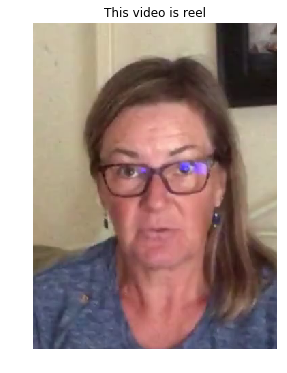

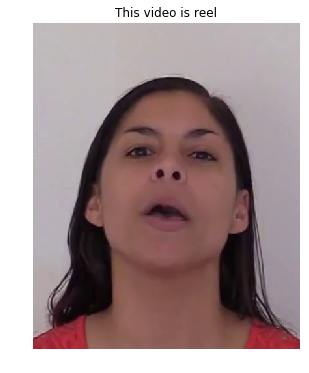

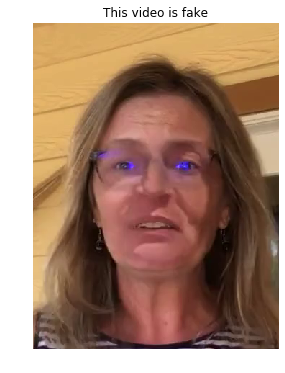

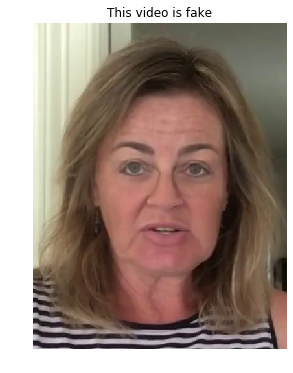

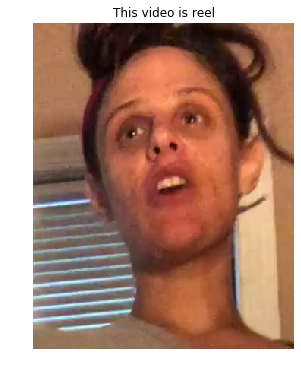

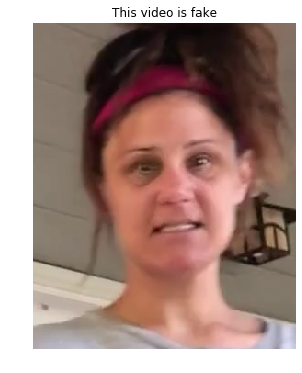

In [53]:
import cv2
import pandas as pd
from mtcnn import MTCNN
import matplotlib.pyplot as plt

# Load the DataFrame


# Initialize the face detector (MTCNN)
detector = MTCNN()

# Iterate over each video in the DataFrame
for index, row in df.iterrows():
    # Get video filename and prediction value
    video_filename = row['Video']
    prediction = row['Predictions']

    # Check if the prediction is above 0.60
    if prediction > 0.60:
        title = "This video is fake"
    else:
        title = "This video is reel"

    # Load the video
    cap = cv2.VideoCapture("/kaggle/input/deepfake-detection-challenge/test_videos/"+video_filename)

    # Read the first frame
    ret, frame = cap.read()

    # Detect faces in the frame
    faces = detector.detect_faces(frame)

    # Display the frame with the title using plt
    plt.figure(figsize=(10, 6))  # Set the figure size

    for face in faces:
        x, y, w, h = face['box']

        # Calculate zoomed coordinates
        zoom_x = max(x - w // 2, 0)
        zoom_y = max(y - h // 2, 0)
        zoom_w = min(2 * w, frame.shape[1] - zoom_x)
        zoom_h = min(2 * h, frame.shape[0] - zoom_y)

        # Zoomed face region
        zoomed_face = frame[zoom_y:zoom_y+zoom_h, zoom_x:zoom_x+zoom_w]

        # Display the zoomed face region
        plt.imshow(cv2.cvtColor(zoomed_face, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
        plt.show()

    cap.release()


In [ ]:
%%time
predictions = predict_on_video_set(test_videos, num_workers=4)

In [ ]:
speedtest_videos = test_videos
df = pd.DataFrame({'Video': speedtest_videos, 'Predictions': predictions})
df.to_csv("submission_xception.csv", index=False)


In [ ]:
df.head()

In [ ]:
import cv2
import pandas as pd
from mtcnn import MTCNN
import matplotlib.pyplot as plt

# Load the DataFrame


# Initialize the face detector (MTCNN)
detector = MTCNN()

# Iterate over each video in the DataFrame
for index, row in df.iterrows():
    # Get video filename and prediction value
    video_filename = row['Video']
    prediction = row['Predictions']

    # Check if the prediction is above 0.60
    if prediction > 0.60:
        title = "This video is fake"
    else:
        title = "This video is reel"

    # Load the video
    cap = cv2.VideoCapture("/kaggle/input/deepfake-detection-challenge/test_videos/"+video_filename)

    # Read the first frame
    ret, frame = cap.read()

    # Detect faces in the frame
    faces = detector.detect_faces(frame)

    # Display the frame with the title using plt
    plt.figure(figsize=(10, 6))  # Set the figure size

    for face in faces:
        x, y, w, h = face['box']

        # Calculate zoomed coordinates
        zoom_x = max(x - w // 2, 0)
        zoom_y = max(y - h // 2, 0)
        zoom_w = min(2 * w, frame.shape[1] - zoom_x)
        zoom_h = min(2 * h, frame.shape[0] - zoom_y)

        # Zoomed face region
        zoomed_face = frame[zoom_y:zoom_y+zoom_h, zoom_x:zoom_x+zoom_w]

        # Display the zoomed face region
        plt.imshow(cv2.cvtColor(zoomed_face, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
        plt.show()

    cap.release()


On this video the nose of the person is strange.

The glasses of this don't look very realistic. There is also a strange rounded shape around the right eye of the lady. Strange white spot to the right of the mouth.

The face of this person is so blurry.

Let's also look at a couple of real images:

We can see that real faces have such details as:
* actual teeth (not just one white blob);
* glasses with reflections.

This one will be really hard to predict! To my mind, the videos like these are garbage and should be removed from the training set.

These fakes are really nice! Only small details tell that those are not real.

## Preview Multiple Frames

Let's look at multiple frames:

Static images don't look so bad, but if we look at the video (use the code for animation: `create_animation` function above) we see a lot of artifacts, which tell us that the video is fake.

Now let's look closer at the person's face in motion:

We clearly see that the video is fake looking closer at the face! Some frames are really creepy. And there is flickering.

Individual frames don't look too bad. This means that we have to build models using maximum frames, we can't just sample some frames. But we can use only frames containing faces to train the model.

## Explore the Similarity between Frames

We can see that there are some similarity drops, let's try to look at the frames in this area:

Let's compare similarity score with the original video (it is not among samples, I uploaded it in separate dataset):

Open video and look at the first frame:

The difference between real and fake is quite clear. Just look at the nose.

Let's get the frames and plot the similarity scores:

Plot similarity scores together:

The similarity scores of the original image are almost identical __if we take the whole frames__. Image similarity could still work if taking only frames containing faces. But I should fix the face detection first.

## Improvement

1. Haar cascades don't seem to be very convenient tool. Setting up the parameters to match various images seems to be nearly manual. Consider using deep learning techniques, such as [MTCNN](https://github.com/ipazc/mtcnn) to detect faces.

## Deepfake Research Papers

1. [Unmasking DeepFakes with simple Features](https://arxiv.org/pdf/1911.00686v2.pdf): The method is based on a classical frequency domain analysis
followed by a basic classifier. Compared to previous systems, which need to be fed with large amounts of labeled data, this
approach showed very good results using only a few annotated training samples and even achieved good accuracies in fully
unsupervised scenarios. [Github repo](https://github.com/cc-hpc-itwm/DeepFakeDetection)

2. [FaceForensics++: Learning to Detect Manipulated Facial Images](https://arxiv.org/pdf/1901.08971v3.pdf): This paper
examines the realism of state-of- the-art image manipulations, and how difficult it is to detect them, either automatically
or by humans. [Github repo](https://github.com/ondyari/FaceForensics)

3. [In Ictu Oculi: Exposing AI Generated Fake Face Videos by Detecting Eye Blinking](https://arxiv.org/pdf/1806.02877v2.pdf): Method is based on detection of eye blinking in the videos,
which is a physiological signal that is not well presented in the synthesized fake videos. Method is tested over
benchmarks of eye-blinking detection datasets and also show promising performance on detecting videos generated with DeepFake.
[Github repo](https://github.com/danmohaha/WIFS2018_In_Ictu_Oculi)

4. [USE OF A CAPSULE NETWORK TO DETECT FAKE IMAGES AND VIDEOS](https://arxiv.org/pdf/1910.12467v2.pdf): "Capsule-Forensics"
method to detect fake images and videos. [Github repo](https://github.com/nii-yamagishilab/Capsule-Forensics-v2)

5. [Exposing DeepFake Videos By Detecting Face Warping Artifacts](https://arxiv.org/pdf/1811.00656v3.pdf): Deep learning based
method that can effectively distinguish AI-generated fake videos (referred to as DeepFake videos hereafter) from real videos.
Method is based on the observations that current DeepFake algorithm can only generate images of limited resolutions, which
need to be further warped to match the original faces in the source video. Such transforms leave distinctive artifacts in
the resulting DeepFake videos, and we show that they can be effectively captured by convolutional neural networks (CNNs).
[Github repo](https://github.com/danmohaha/CVPRW2019_Face_Artifacts)

6. [Limits of Deepfake Detection: A Robust Estimation Viewpoint](https://arxiv.org/pdf/1905.03493v1.pdf): This work gives a
generalizable statistical framework with guarantees on its reliability. In particular, we build on the information-theoretic
study of authentication to cast deepfake detection as a hypothesis testing problem specifically for outputs of GANs,
themselves viewed through a generalized robust statistics framework.

## Conclusion

In this notebook:
* I loaded saparate frames of the videos and sequences of video frames.
* I created some animation of fake videos.
* I used Haar cascades for face detection and zoomed into real and fake faces.
* I looked at the similarity between frames.

Fake videos can be detected by:
* Small missing details (nose, glasses, teeth),
* Blurry contours of the face,
* Flickering.

__Please, leave your comments and/or suggestions. I am really happy to hear from you!__